# Assignment 2

### Imports

Import the required libraries

In [27]:
import numpy as np
import cv2
import requests
import os
from google.colab.patches import cv2_imshow
from google.colab import files

### Utlilities

This function download a file from a given url

In [2]:
def download_file(file_url, file_name):
  video = requests.get(file_url).content
  with open(file_name, 'wb') as handler:
    handler.write(video)
  return os.path.join(os.getcwd(), file_name)

This function is used to return a list of all frames for a given video

In [3]:
def extract_frames(video_path):
  video = cv2.VideoCapture(video_path)
  frames = []

  while True:
    ret, frame = video.read()

    if not ret:
      break

    frames.append(frame)

  return frames

This function construct a video from a given list of frames

In [4]:
def construct_video_from_frames(frames, video_name):
  h, w = frames[0].shape[:2]

  fourcc = cv2.VideoWriter_fourcc(*'mp4v')
  video = cv2.VideoWriter(video_name, fourcc, 25, (w, h))

  for frame in frames:
    video.write(frame)

  return os.path.join(os.getcwd(), video_name)

The following methods perform the following:

1. Convert form homogenous coordinates to heterogenous
2. Convert from heterogenous coordinates to homogenous
3. Apply the matrix transformation and return either integer **needed for forward mapping** coordinates or float coordiantes

In [5]:
def hom_to_hetr(coordinates):
  last_column = coordinates[:, -1]
  return coordinates[:, :-1] / last_column[:, np.newaxis]

In [6]:
def hetr_to_hom(coordinates):
  return np.column_stack((coordinates, np.ones(coordinates.shape[0])))

In [7]:
def apply_matrix_transformation(matrix, coordinates):
  hom_coordinates = matrix @ hetr_to_hom(coordinates).T
  return np.rint(hom_to_hetr(hom_coordinates.T)).astype(int)

In [8]:
def apply_matrix_transformation_float(matrix, coordinates):
  hom_coordinates = matrix @ hetr_to_hom(coordinates).T
  return hom_to_hetr(hom_coordinates.T)

This function is used to crop a frame from the ceneter keeping the given aspect ratio

In [9]:
def crop_frames(frames, crop_width, crop_height):
  h, w = frames[0].shape[:2]
  aspect_ratio = crop_width / crop_height
  new_width = int(aspect_ratio*h)
  return np.array([frame[:, (w - new_width)//2:(w + new_width)//2] for frame in frames])

In [10]:
def get_image_indices(image):
  return np.indices((image.shape[:2][::-1])).reshape(2, -1).T

**This function is used to create the AR Video:**

**parameters**

1. **book_cover** The book cover image that will be used to compute the homography matrix that will transform the trailer video on the book cover video
2. **book_frames** list of book cover video frames
3. **cropped_source_frames** list of the trailer video frames which is cropped to fit the book cover image
4. **video_name** name of the generated video

**return**

A video of the augmented trailer video on the book cover

**steps**

1. At first, we extend the cropped trailer video to have same length of book cover video.
2. Secondly, For each frame in the book cover video, we get the correspondances between the book cover image and video, with distance ratio 0.25 and use them to find the homography matrix.
3. After that, we resize the trailer frame to the book cover size and apply the homography matrix on its pixels to find the new locations of them on the book cover video.
4. Finally, we apply forward warpping and append the new frames that augmented with the trailer in a list which is used to generate the AR video.

In [11]:
def create_ar_video(book_cover, book_frames, cropped_source_frames, video_name):
  frames_to_add = len(book_frames) - len(cropped_source_frames)
  last_frame = cropped_source_frames[-1].copy()
  cropped_source_frames_new = np.concatenate((cropped_source_frames, [last_frame for _ in range(frames_to_add)]))

  gray_book_frames = [cv2.cvtColor(book_frame, cv2.COLOR_BGR2GRAY) for book_frame in book_frames]
  gray_book_cover = cv2.cvtColor(book_cover, cv2.COLOR_BGR2GRAY)

  frames = []
  cover_height, cover_width = book_cover.shape[:2]
  limit_height, limit_width = book_frames[0].shape[:2]

  for i in range(len(book_frames)):
    src_pts, dst_pts = get_correspondences(gray_book_cover, gray_book_frames[i], 0.25)
    homography_matrix = compute_homography_parameters(src_pts, dst_pts)

    resized_image = cv2.resize(cropped_source_frames_new[i], (cover_width, cover_height))

    old_pts = get_image_indices(resized_image)
    transformed_pts = apply_matrix_transformation(homography_matrix, old_pts)

    frame = book_frames[i].copy()
    for old_pt, transformed_pt in zip(old_pts, transformed_pts):
      if transformed_pt[0] >= limit_width or transformed_pt[0] < 0 \
          or transformed_pt[1] >= limit_height or transformed_pt[1] < 0:
        continue
      frame[transformed_pt[1], transformed_pt[0]] = resized_image[old_pt[1]][old_pt[0]]

    frames.append(frame)

  return construct_video_from_frames(frames, video_name)

##Part 1:Augmented Reality with Planar Homographies

Download book cove image, video and the trailer video

In [12]:
# Downloading book, ar source videos and book cover
book_video_path = download_file('https://raw.githubusercontent.com/sooah/CMU_ComputerVision/master/HW4/data/book.mov', 'book.mov')
source_video_path = download_file('https://raw.githubusercontent.com/sooah/CMU_ComputerVision/master/HW4/data/ar_source.mov', 'source.mov')
book_cover_path = download_file('https://raw.githubusercontent.com/sooah/CMU_ComputerVision/master/HW4/data/cv_cover.jpg', 'book_cover.jpg')

Extract the frames of each video and conver them to gray scale

In [13]:
# Reading book and source video frames and book cover
book_frames = extract_frames(book_video_path)
source_frames = extract_frames(source_video_path)
book_cover = cv2.imread(book_cover_path)

gray_book_frames = [cv2.cvtColor(book_frame, cv2.COLOR_BGR2GRAY) for book_frame in book_frames]
gray_book_cover = cv2.cvtColor(book_cover, cv2.COLOR_BGR2GRAY)

**This function is used to find the correspondences used to compute the homography matrix**

**parameters**

1. **src_img** The image that containing keypoints of interest
2. **target_img** The image used to find the matches of the source image keypoints
3. **threshold** The distance ratio used to select a good match
4. **show_img** a boolean used to determine whether to visualize the matches or no

**return**

 the good matches between the source and target image

**steps**

1. At first, we create a sift descriptor and use it to find the keypoints and their descriptors.
2. Secondly, for each keypoint in the source image, we use the brute force matcher to find the two best matches in the target image.
3. After that, we filter the matches to only select those whose distance between the first and second match less than the threshold.
4. Finally, we return two list for the keypoints in the source and target image that represent the good correspondences.

In [14]:
# resources: https://docs.opencv.org/4.x/dc/dc3/tutorial_py_matcher.html

def get_correspondences(src_img, target_img, threshold, show_img=False):
  sift = cv2.SIFT_create()

  # Detecting keypoint
  src_img_kp, src_img_desc = sift.detectAndCompute(src_img, None)
  target_img_kp, target_img_desc = sift.detectAndCompute(target_img, None)

  # Getting matches using KNN with k=2
  bf = cv2.BFMatcher()
  matches = bf.knnMatch(src_img_desc, target_img_desc, k=2)

  # Applying ratio checking to get the good correspondences
  good_matches = []

  for a, b in matches:
    if a.distance <= b.distance * threshold:
      good_matches.append(a)

  if show_img:
    img_matches = cv2.drawMatches(src_img,
                                  src_img_kp,
                                  target_img,
                                  target_img_kp,
                                  good_matches[:50],
                                  None,
                                  flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    cv2_imshow(img_matches)

  src_pts = np.float32([src_img_kp[m.queryIdx].pt for m in good_matches])
  dst_pts = np.float32([target_img_kp[m.trainIdx].pt for m in good_matches])

  return src_pts, dst_pts

Find the matches between the book cover image and the first frame in the video and visualize them

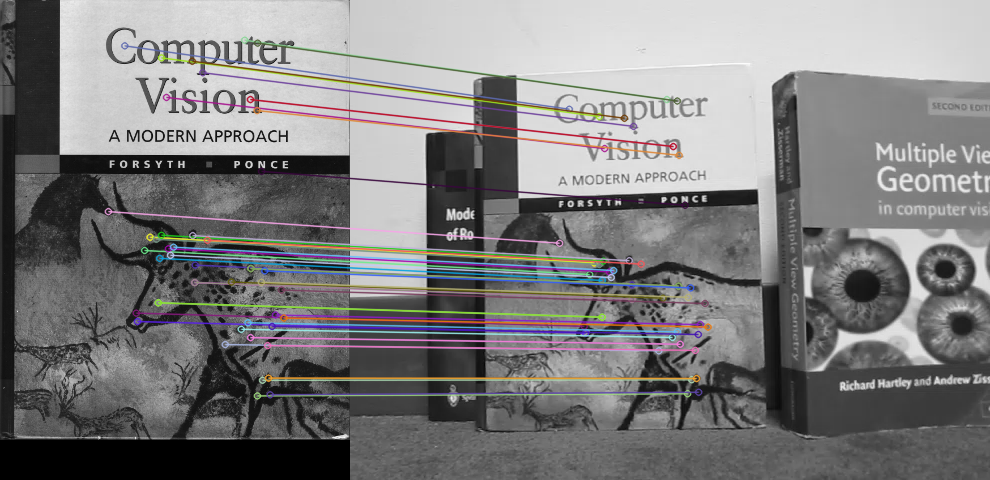

In [15]:
src_pts, dst_pts = get_correspondences(gray_book_cover, gray_book_frames[0], 0.248, True)

**This method is used to compute the homography matrix:**

**paramerters**

1. **p** the original points.
2. **p_dash** the transformed points.

**return**

The parameters of the homography matrix

**steps**

1. Assert that we have at least four correspondences.
2. Construct the system of equation x' = A * x
3. Compute the svd of matrix A.
4. Select the column of V corrsponding to the smallest singular valuev in A and whose valuse are the parameters of the homography matrix.
5. Return this column after beign reshaped into 3 x 3 matrix.

In [16]:
def compute_homography_parameters(p, p_dash):
  assert len(p) == len(p_dash)
  assert len(p) >= 4

  A = []
  for i in range(len(p)):
    x, y = p[i]
    x_dash, y_dash = p_dash[i]
    A.append(np.array([-x, -y, -1, 0, 0, 0, x*x_dash, y*x_dash, x_dash]))
    A.append(np.array([0, 0, 0, -x, -y, -1, x*y_dash, y*y_dash, y_dash]))

  A = np.array(A)
  U, S, Vt = np.linalg.svd(A, full_matrices=False)

  min_eigenvalue_index = np.argmin(S)
  x = Vt[min_eigenvalue_index, :]
  factor = x[-1]
  x = x * (1/factor)
  x = x.reshape((3, 3))

  return x

Compute the homography using our function and the built-in function in open cv and it seems their values are too similar.

In [17]:
homography_matrix = compute_homography_parameters(src_pts, dst_pts)
homography_matrix_actual = cv2.findHomography(src_pts, dst_pts)[0]

In [18]:
print(homography_matrix)

[[ 7.73590759e-01  3.54551769e-03  1.19432012e+02]
 [-5.25086579e-02  7.78880843e-01  7.79102820e+01]
 [-9.17335262e-05 -7.32380115e-05  1.00000000e+00]]


In [19]:
print(homography_matrix_actual)

[[ 7.74868231e-01  3.68078995e-03  1.19317650e+02]
 [-5.18009407e-02  7.79518568e-01  7.77765004e+01]
 [-8.92416965e-05 -7.28527403e-05  1.00000000e+00]]


Find the transformation of the book cover corner points using our computed homorgraphy and the one computed using the built-in function and visualize them

In [20]:
book_cover_corner = np.float32([[0, 0],
                                [0, book_cover.shape[0]],
                                [book_cover.shape[1], 0],
                                [book_cover.shape[1], book_cover.shape[0]]])

transformed_pts_res = cv2.perspectiveTransform(book_cover_corner.reshape(-1, 1, 2), homography_matrix)
transformed_pts_act = cv2.perspectiveTransform(book_cover_corner.reshape(-1, 1, 2), homography_matrix_actual)

image_res = book_frames[0].copy()
image_act = book_frames[0].copy()

cv2.putText(image_res, "Result Homography Matrix", (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
cv2.putText(image_act, "Actual Homography Matrix", (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

for point in transformed_pts_res:
    cv2.circle(image_res, (int(point[0, 0]), int(point[0, 1])), 5, (0, 255, 0), -1)

for point in transformed_pts_act:
    cv2.circle(image_act, (int(point[0, 0]), int(point[0, 1])), 5, (0, 255, 0), -1)

concatenated_image = cv2.hconcat([image_res, image_act])

print(f"result transformed point:\n{transformed_pts_res}")
print(f"actual transformed point:\n{transformed_pts_act}")

result transformed point:
[[[119.432014  77.91028 ]]

 [[125.0208   434.62347 ]]

 [[403.13202   61.507042]]

 [[418.68332  429.89563 ]]]
actual transformed point:
[[[119.31765   77.7765  ]]

 [[124.942245 434.69904 ]]

 [[403.11258   61.569263]]

 [[418.6365   429.83875 ]]]


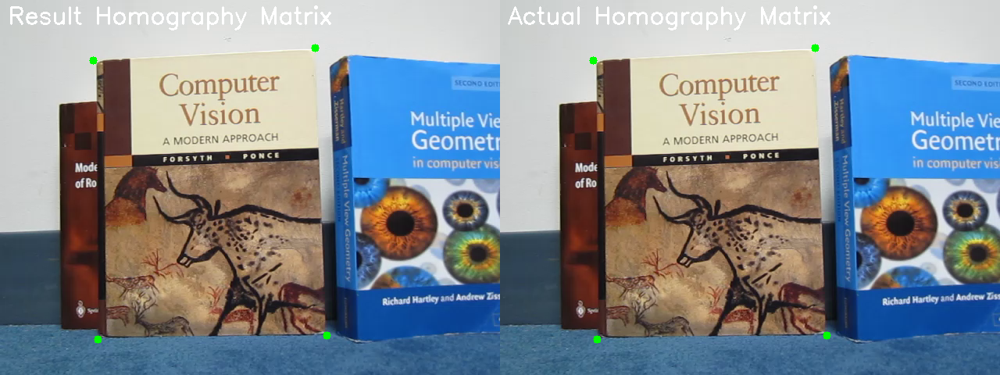

In [21]:
cv2_imshow(concatenated_image)

Crop the trailer video with same aspect ratio of the book cover image

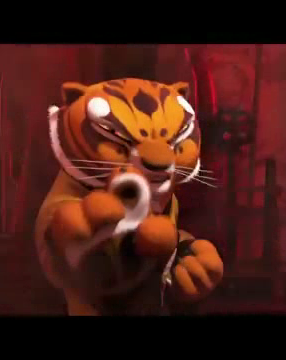

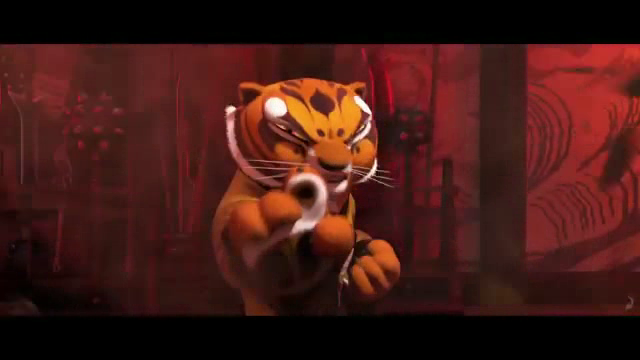

In [22]:
cropped_source_frames = crop_frames(source_frames, book_cover.shape[1], book_cover.shape[0])
cv2_imshow(cropped_source_frames[102])
cv2_imshow(source_frames[102])

In [23]:
print(f'book width: {book_cover.shape[1]} book height: {book_cover.shape[0]}')

book width: 350 book height: 440


In [24]:
print(f'video width: {source_frames[22].shape[1]} video height: {source_frames[22].shape[0]}')

video width: 640 video height: 360


In [25]:
print(f'cropped video width: {cropped_source_frames[22].shape[1]} video height: {cropped_source_frames[22].shape[0]}')

cropped video width: 286 video height: 360


Generate the AR video and save it

In [26]:
ar_video_path = create_ar_video(book_cover, book_frames, cropped_source_frames, 'ar_video.mov')

In [28]:
# download video
files.download(ar_video_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [29]:
ar_video_frames = extract_frames(ar_video_path)

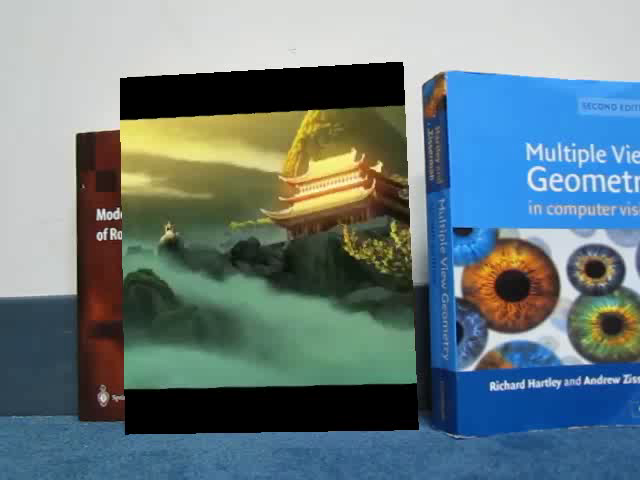

In [30]:
# first frame
cv2_imshow(ar_video_frames[0])

## Part 2: Image Mosaics

**This funnction is used to perform forward warping:**

**parameters**

1. **left_img** The first image to be stiched
2. **right_img** The second image to be stiched
3. **homography_matrix** The homography matrix used to warp the right_img on the left
4. **size** The size of the mosaic image
5. **hight_offset** The offset of the warped image from the top
6. **width_offset** The offset of the warped image from the left

**returns**

The mosaic of the images after warping the right image on the left

**steps**

1. get the indices of pixels of the left and right image.
2. transform the pixels of the right image using the given homography **transform pixels of right image to left image**
3. create empty image to conatin both the left image and the warped right image
4. fill the new image with pixels of the left image and the transformed pixels of the right image

**problem**

This method generate holes in the warped image because there are no pixels from the right map to the locations of the holes after transformation.


In [31]:
def forward_warping(left_img, right_img, homography_matrix, size, height_offset, width_offset):
  h, w = right_img.shape[0:2]
  old_pts_right = get_image_indices(right_img)
  old_pts_left = get_image_indices(left_img)
  transformed_pts = apply_matrix_transformation(homography_matrix, old_pts_right)

  warped_image = np.zeros(size, dtype=left_img.dtype)

  for old_pt, transformed_pt in zip(old_pts_right, transformed_pts):
    warped_image[transformed_pt[1] + height_offset][transformed_pt[0] + width_offset] = right_img[old_pt[1]][old_pt[0]]

  for old_pt in old_pts_left:
    warped_image[old_pt[1] + height_offset][old_pt[0] + width_offset] = left_img[old_pt[1]][old_pt[0]]

  return warped_image

**This funnction is used to perform inverse warping:**

**parameters**

1. **img** The mosaic of images generated from warping them to new image.
2. **right_img** The transformed image using homography.
3. **inv_homography_matrix** The inverse homography matrix used to warp the right_img on the left
4. **hight_offset** The offset of the warped image from the top
5. **width_offset** The offset of the warped image from the left

**returns**

The mosaic of the images after perfroming inverse warping and fixing the holes problem

**steps**

1. Find the locations of the holes **have pixel value == 0** in the mosaic of images
2. Inverse the vertical and horizontal shifting used in forward warping.
3. Apply the inverse transformation on the coordinates of the holes and get their original locations on the warped image.
4. Perfrom bilinear interpolation using the neighbours of the transformed points to determine their values.
5. Fill the holes in the mosaic of images with the values obtained by interpolating the neighbours of poins obtained by inverse homography

In [32]:
def backward_warping(image, right_img, inv_homography_matrix, height_offset, width_offset):
  h, w = right_img.shape[:2]
  warped_image = image.copy()

  holes_indecies = np.column_stack(np.where(np.all(warped_image < 20, axis=-1)))
  holes_indecies[:, 0] = holes_indecies[:, 0] - height_offset
  holes_indecies[:, 1] = holes_indecies[:, 1] - width_offset
  holes_indecies = holes_indecies[:, [1, 0]]

  org_from_holes = apply_matrix_transformation_float(inv_homography_matrix, holes_indecies)

  for hole, org in zip(holes_indecies, org_from_holes):
    if org[1] < 0 or org[0] < 0 or org[1] >= h-1 or org[0] >= w-1:
      continue

    for i in range(right_img.shape[2]):
      x_min, x_max = int(np.floor(org[1])), int(np.ceil(org[1]))
      y_min, y_max = int(np.floor(org[0])), int(np.ceil(org[0]))

      x_y_mat = np.array([[right_img[x_min, y_min, i], right_img[x_min, y_max, i]],
                          [right_img[x_max, y_min, i], right_img[x_max, y_max, i]]])

      x_vec = np.array([x_max - org[1], org[1] - x_min])
      y_vec = np.array([y_max - org[0], org[0] - y_min])

      x_vec = x_vec.reshape(1, 2)
      y_vec = y_vec.reshape(2, 1)

      value = x_vec.dot(x_y_mat).dot(y_vec)
      value = int(value)

      warped_image[hole[1] + height_offset, hole[0] + width_offset][i] = value

  return warped_image

**This funnction is used to generate the mosaic:**

**parameters**

1. **left_img** The first image to be stiched
2. **right_img** The second image to be stiched
3. **size** The size of the mosaic image
4. **hight_offset** The offset of the warped image from the top
5. **width_offset** The offset of the warped image from the left


**returns**

The mosaic of the images after perfroming forawd and inverse warping

**steps**

1. Find the matches between the left and and right image to be stiched using SIFT and BFM with distance ratio 0.3
2. Compute the homography matrix using the built-in function
3. Perform the forward warping and inverse warping
4. Finally, return the mosaic of images

In [33]:
def generate_mosaic(left_img, right_img, size, height_offset, width_offset):
  gray_left = cv2.cvtColor(left_img, cv2.COLOR_BGR2GRAY)
  gray_right = cv2.cvtColor(right_img, cv2.COLOR_BGR2GRAY)
  src_pts, dst_pts = get_correspondences(gray_right, gray_left, 0.3, False)

  homography_matrix = cv2.findHomography(src_pts, dst_pts)[0]
  forward_warping_img = forward_warping(left_img, right_img, homography_matrix, size, height_offset, width_offset)

  inv_homography_matrix = np.linalg.inv(homography_matrix)
  backward_warping_img = backward_warping(forward_warping_img, right_img, inv_homography_matrix, height_offset, width_offset)

  return backward_warping_img

Load the images to be stiched

In [34]:
pano_left_path = download_file('https://slazebni.cs.illinois.edu/spring18/assignment3/uttower_left.JPG', 'pano_left.jpg')
pano_right_path = download_file('https://slazebni.cs.illinois.edu/spring18/assignment3/uttower_right.JPG', 'pano_right.jpg')

In [35]:
pano_left = cv2.imread(pano_left_path)
pano_right = cv2.imread(pano_right_path)

(683, 1024, 3)


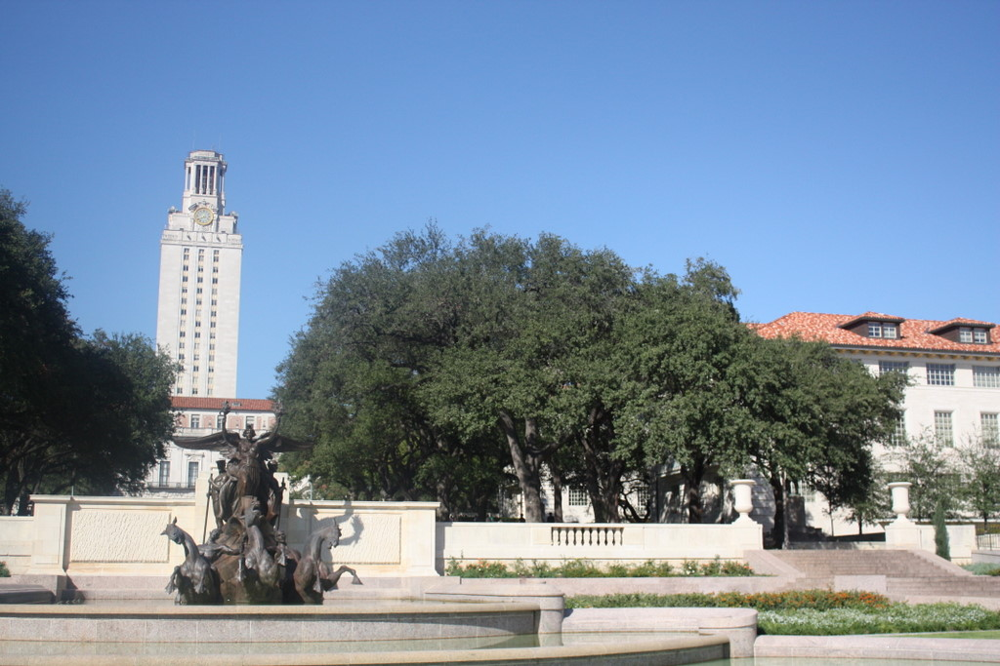

In [36]:
print(pano_left.shape)
cv2_imshow(pano_left)

(683, 1024, 3)


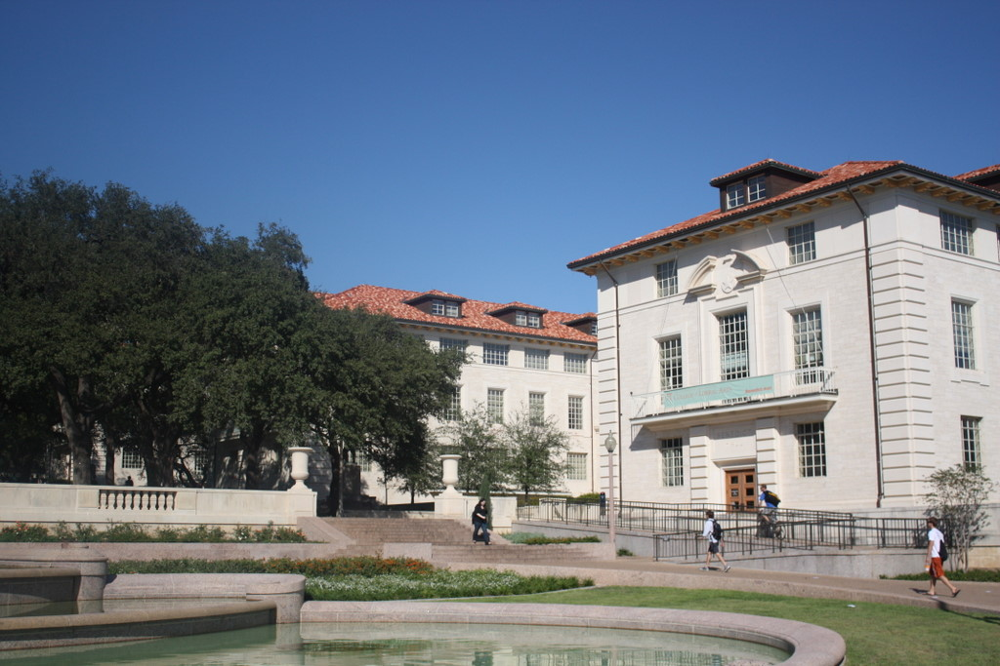

In [37]:
print(pano_right.shape)
cv2_imshow(pano_right)

Find the matches between the left and right image with distance ratio 0.3 and visualize them

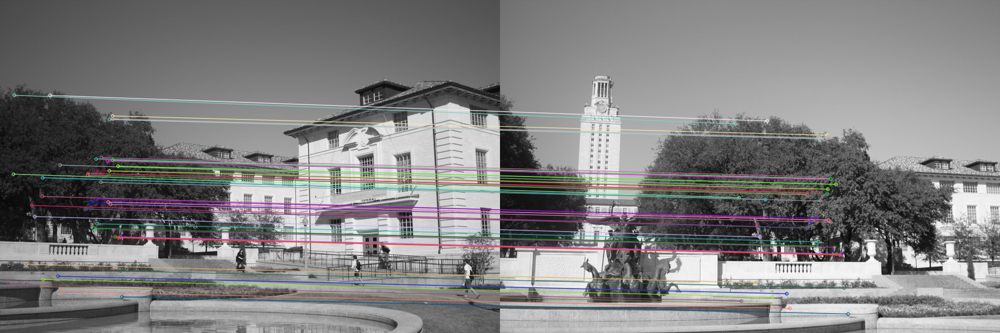

In [38]:
gray_pano_left = cv2.cvtColor(pano_left, cv2.COLOR_BGR2GRAY)
gray_pano_right = cv2.cvtColor(pano_right, cv2.COLOR_BGR2GRAY)
src_pts, dst_pts = get_correspondences(gray_pano_right, gray_pano_left, 0.3, True)

Compute the homography matrix using the matches and perfrom forward warping.

We can notice the holes in the mosiac of image due some pixel that no pixel of the warped image map to it.

In [39]:
homography_matrix = cv2.findHomography(src_pts, dst_pts)[0]
forward_warping_img = forward_warping(pano_left, pano_right, homography_matrix, (850, 1650, 3), 100, 0)

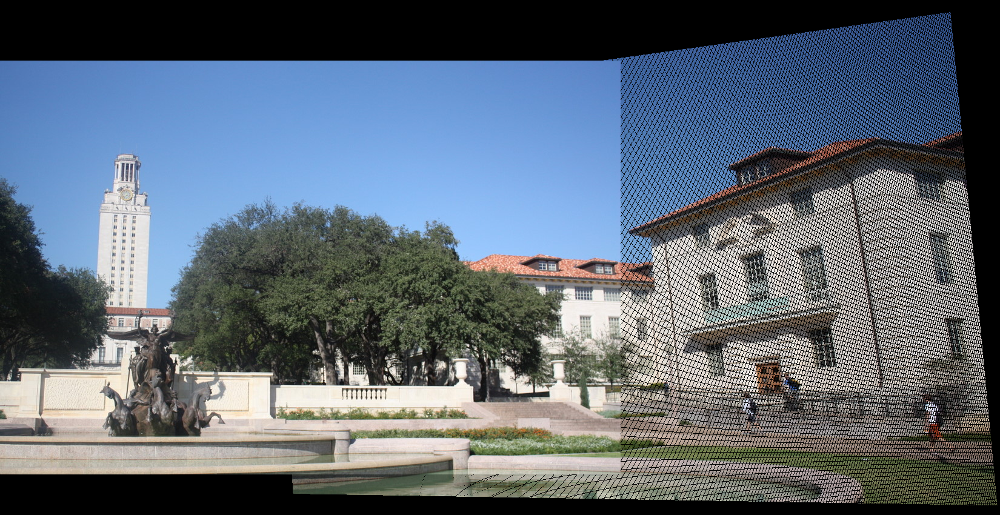

In [40]:
cv2_imshow(forward_warping_img)

Perfrom inverse warping and we can notice that it fixes the holes problem

In [41]:
inv_homography_matrix = np.linalg.inv(homography_matrix)
backward_warping_img = backward_warping(forward_warping_img, pano_right, inv_homography_matrix, 100, 0)

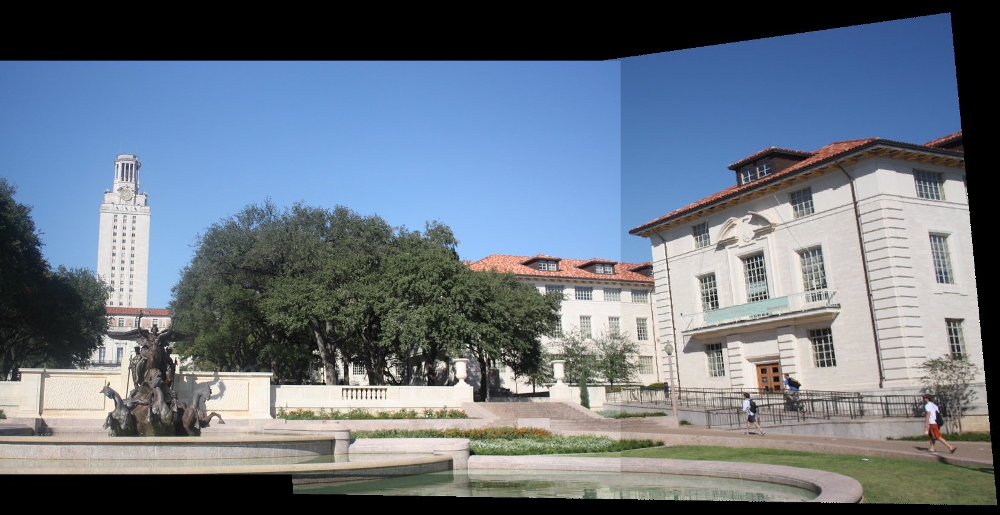

In [42]:
cv2_imshow(backward_warping_img)

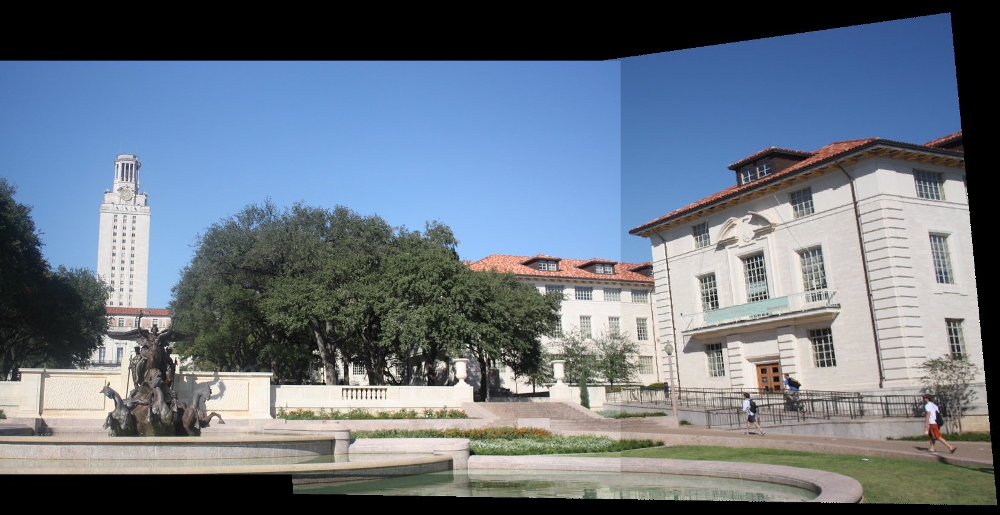

In [43]:
# All in one step
mosaic = generate_mosaic(pano_left, pano_right, (850, 1650, 3), 100, 0)
cv2_imshow(mosaic)

# Bonus Part

In the part we stich 3 images be perfrom the previous on two images and stich their result with the third image

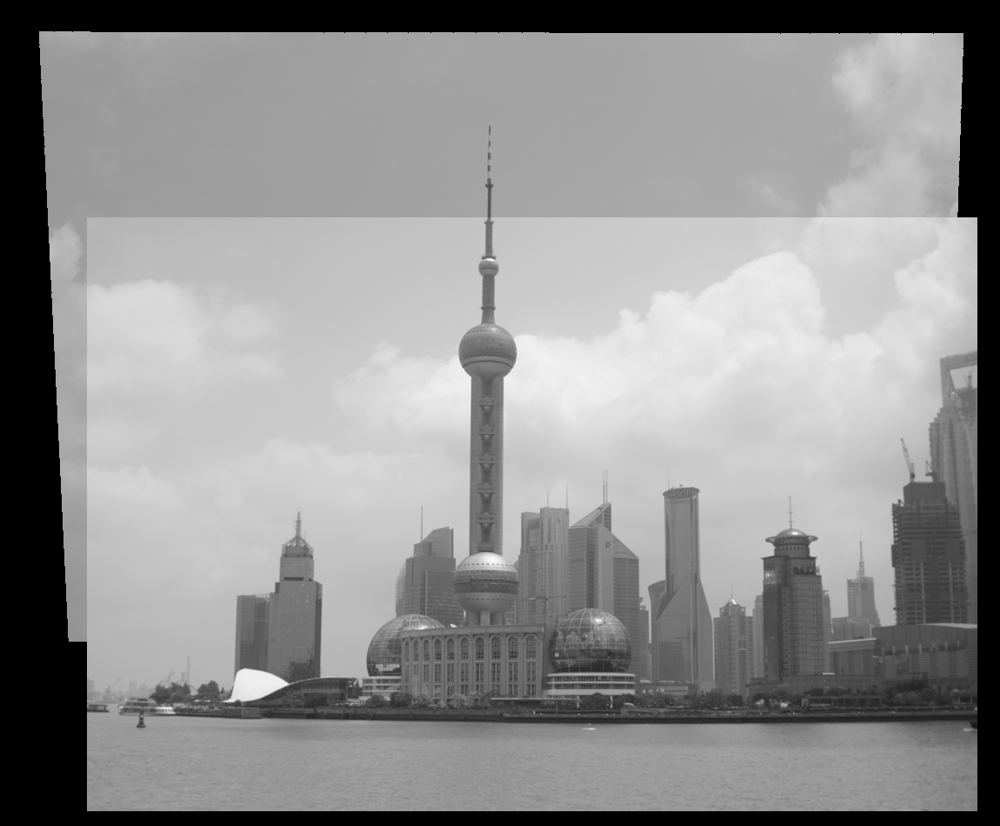

In [46]:
img1 = cv2.imread('/content/shanghai-21.png')
img2 = cv2.imread('/content/shanghai-22.png')
img3 = cv2.imread('/content/shanghai-23.png')

mosaic1 = generate_mosaic(img1, img2, (950, 1150, 3), 250, 100)
cv2_imshow(mosaic1)

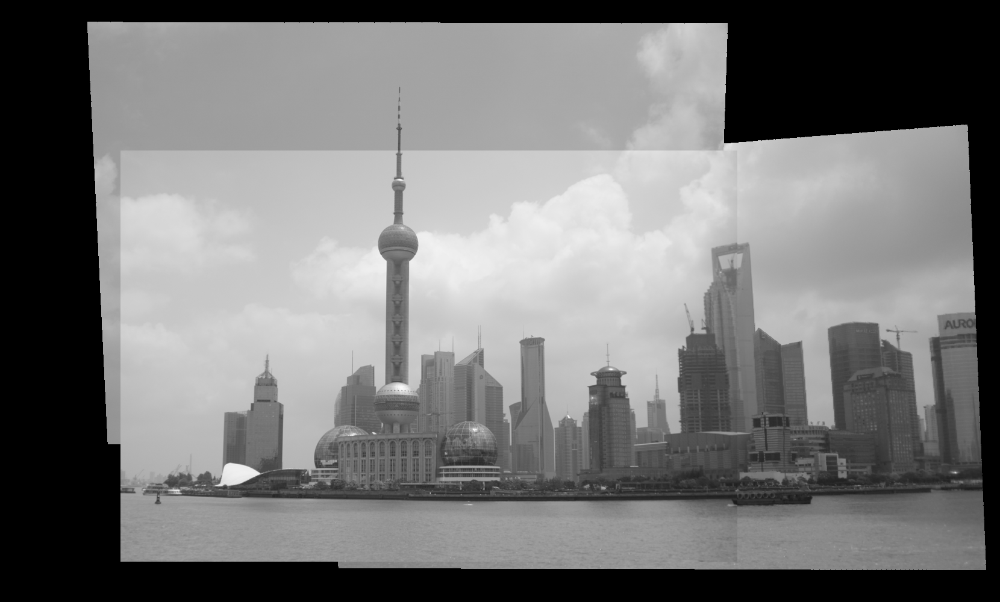

In [47]:
mosaic = generate_mosaic(mosaic1, img3, (1000, 1660, 3), 0, 100)
cv2_imshow(mosaic)